Dikarenakan pada github tidak muncul hasil visualisasinya, berikut link yang dapat dilihat https://nbviewer.org/github/Divanabila26/MSIB-Hacktiv8/blob/63aa62f569bbfe959b0b0eac23f63ef5ce66e9dc/PYTN_Assgn_1_5_Diva%20Nabila.ipynb 

## Libraries

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import folium
from wordcloud import WordCloud,STOPWORDS
from folium import plugins
from urllib.request import urlopen
import json



## Data

In [3]:
data = pd.read_csv("D:\london_crime_by_lsoa.csv")
data.head()

,lsoa_code,borough,major_category,minor_category,value,year,month
0,E01001116,Croydon,Burglary,Burglary in Other Buildings,0,2016,11
1,E01001646,Greenwich,Violence Against the Person,Other violence,0,2016,11
2,E01000677,Bromley,Violence Against the Person,Other violence,0,2015,5
3,E01003774,Redbridge,Burglary,Burglary in Other Buildings,0,2016,3
4,E01004563,Wandsworth,Robbery,Personal Property,0,2008,6


Buat salinan dari dataset diatas dengan nama df, sehingga apabila terjadi perubahan tidak akan mempengaruhi dataset asli. 

In [4]:
df = data.copy()

Periksa data terlebih dahulu, apakah terdapat nilai null didalamnya. 

In [5]:
df.isnull().sum()

lsoa_code         0
borough           0
major_category    0
minor_category    0
value             0
year              0
month             0
dtype: int64

Buat kolom baru bernama date dengan menggabungkan kolom year dan month.

In [6]:
date = []
for i,j in zip(df["year"], df['month']):
    date.append(f"{i} {j}")

df["date"] = date

df["date"] = pd.to_datetime(df["date"])

df.head()

C:\Users\Thinkpad Yoga\AppData\Local\Temp\ipykernel_16344\698967856.py:7: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df["date"] = pd.to_datetime(df["date"])


,lsoa_code,borough,major_category,minor_category,value,year,month,date
0,E01001116,Croydon,Burglary,Burglary in Other Buildings,0,2016,11,2016-11-01
1,E01001646,Greenwich,Violence Against the Person,Other violence,0,2016,11,2016-11-01
2,E01000677,Bromley,Violence Against the Person,Other violence,0,2015,5,2015-05-01
3,E01003774,Redbridge,Burglary,Burglary in Other Buildings,0,2016,3,2016-03-01
4,E01004563,Wandsworth,Robbery,Personal Property,0,2008,6,2008-06-01


Hapus kolom yang tidak diperlukan dan tetapkan date sebagai indeks.

In [7]:
df = df.sort_values("date")
df = df.drop(["lsoa_code","year","month"],axis=1)
df = df.set_index('date')
df.head()

,borough,major_category,minor_category,value
date,,,,
2008-01-01,Barking and Dagenham,Burglary,Burglary in Other Buildings,3
2008-01-01,Redbridge,Criminal Damage,Criminal Damage To Dwelling,0
2008-01-01,Barnet,Drugs,Drug Trafficking,0
2008-01-01,Hammersmith and Fulham,Violence Against the Person,Common Assault,0
2008-01-01,Barking and Dagenham,Sexual Offences,Other Sexual,0


## Line Plot - Tahun berapa yang memiliki jumlah kejahatan tertinggi?

Buat kerangka data yang diberi nama sum_per_year yang berisi jumlah kejahatan berdasarkan tahun.

In [7]:
sum_per_year = df.groupby(df.index.year)[["value"]].sum()
sum_per_year.head()

,value
date,
2008,738641
2009,717214
2010,715324
2011,724915
2012,737329


Buat plot garis untuk memvisualisasikan hasil kerangka data diatas yaitu jumlah kejahatan berdasarkan tahun (year).

In [8]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=sum_per_year.index,
                         y=sum_per_year["value"],
                        mode="lines+markers",
                        line=dict(color="blue")))
fig.update_layout(title="Number of Crimes from 2009 - 2016",
                  title_x=0.5,
                  xaxis_title="Year",
                  yaxis_title="Number of Crime")
fig.show()

Berdasarkan plot diatas, dapat disimpulkan bahwa jumlah kejahatan tertinggi terjadi pada tahun 2008 yaitu sebesar 738.641ribu

## Area Plot - Bagaimana tren kejahtan di 5 wilayah dengan kejahatan tertinggi tahun 2008-2016?

5 wilayah teratas dengan jumlah kejahatan tertinggi adalah:
- Westminter 
- Lambeth
- Southwark
- Camden
- Newham

In [8]:
top_5 = list(df.groupby("borough")["value"].sum().sort_values(ascending=False).head().index)
top_5

['Westminster', 'Lambeth', 'Southwark', 'Camden', 'Newham']

Menyortir atau memotong data tersebut sehingga hanya terdapat 5 wilayah dengan jumlah kejahatan tertinggi. Kemudian jumlahkan jumlah kejahatan menurut setiap wilayah dan tahun.

In [9]:
top_5_percentage = df[df["borough"].isin(top_5)][["borough","value"]]
top_5_percentage = top_5_percentage.groupby(["borough", top_5_percentage.index.year]).sum()[["value"]]
top_5_percentage = top_5_percentage.reset_index()
top_5_percentage.head()

,borough,date,value
0,Camden,2008,32010
1,Camden,2009,31612
2,Camden,2010,31804
3,Camden,2011,33956
4,Camden,2012,31472


Hitung persentase kenaikan atau penurunan kejahatan di setiap wilayah tersebut.

In [10]:
percentage = []
for i in top_5_percentage["borough"].unique():
    temp_data = top_5_percentage[top_5_percentage["borough"] == i]
    temp_value = temp_data["value"]
    percentage.append(list(temp_value.pct_change().fillna(0)))

percentage = np.ravel(percentage)
top_5_percentage["percentage"] = percentage
top_5_percentage["percentage"] = np.round(top_5_percentage["percentage"]*100,2)
top_5_percentage.head()

,borough,date,value,percentage
0,Camden,2008,32010,0.00
1,Camden,2009,31612,-1.24
2,Camden,2010,31804,0.61
3,Camden,2011,33956,6.77
4,Camden,2012,31472,-7.32


Buat plot area untuk memvisualisasikan kejahatan tersebut di Camden lambeth, Newham, Southwark dan Westminter dari 2008-2016

In [11]:
fig = go.Figure()
fig = px.area(top_5_percentage,x="date",y="percentage",color="borough",
              labels={"date":"Year","borough":"Borough","percentage":"Percentage(%)","values":"Number of Crimes"},
              hover_data=["value"])
fig.update_layout(title="Crime Trends in Camden, Lambeth, Newham, Southwark, and Westminster from 2008 - 2016",
                  title_x=0.5,
                  xaxis_title="Year",
                  yaxis_title="Percentage(%)",
                  legend=dict(title="Boroughs"))
fig.show()

Berdasarkan plot wilayah di atas, terlihat bahwa seluruh wilayah mempunyai kecenderungan fluktuasi yang serupa. penurunan kejahatan tertinggi terjadi pada tahun 2012 - 2013 khususnya di Westminter dimana jumlah kejahatan turun dari 59226 menjadi 53852(9,07%)

## Scatter Plot, Histogram, and Box Plot - Apakah data jumlah kejahatan berdasarkan bulan terdistribusi secara normal?

Buat dataframe dengan nama value_per_month yang terdiri dari jumlah kejahatan berdasarkan bulan

In [12]:
value_per_month = df.resample("M")[["value"]].sum()
value_per_month.head()

,value
date,
2008-01-31,65419
2008-02-29,62626
2008-03-31,61343
2008-04-30,59640
2008-05-31,62587


Sebelum membuat Q-Q Plot, terdapat beberapa hal yang perlu dilakukan terlebih dahulu, yaitu:
1. Urutkan nilai x(i) dari yang terkecil hingga terbesar 
2. Hitung p(i), dimana $$p(i) = (i-1/2)/n$$
3. Hitung q(i), dimana <math xmlns="http://www.w3.org/1998/Math/MathML" display="block">
  <mi>P</mi>
  <mo stretchy="false">(</mo>
  <mi>z</mi>
  <mo>&#x2264;</mo>
  <msub>
    <mi>q</mi>
    <mrow data-mjx-texclass="ORD">
      <mo stretchy="false">(</mo>
      <mi>i</mi>
      <mo stretchy="false">)</mo>
    </mrow>
  </msub>
  <mo stretchy="false">)</mo>
  <mo>=</mo>
  <msubsup>
    <mo data-mjx-texclass="OP">&#x222B;</mo>
    <mrow data-mjx-texclass="ORD">
      <mo>&#x2212;</mo>
      <mi mathvariant="normal">&#x221E;</mi>
    </mrow>
    <mrow data-mjx-texclass="ORD">
      <msub>
        <mi>q</mi>
        <mrow data-mjx-texclass="ORD">
          <mo stretchy="false">(</mo>
          <mi>i</mi>
          <mo stretchy="false">)</mo>
        </mrow>
      </msub>
    </mrow>
  </msubsup>
  <mfrac>
    <mn>1</mn>
    <msqrt>
      <mn>2</mn>
      <mi>&#x3C0;</mi>
    </msqrt>
  </mfrac>
  <msup>
    <mi>e</mi>
    <mrow data-mjx-texclass="ORD">
      <mfrac>
        <mrow>
          <mo>&#x2212;</mo>
          <msup>
            <mi>z</mi>
            <mn>2</mn>
          </msup>
        </mrow>
        <mn>2</mn>
      </mfrac>
    </mrow>
  </msup>
  <mi>d</mi>
  <mi>z</mi>
</math>

In [13]:
from scipy.stats import norm,shapiro

n = np.arange(1,len(value_per_month)+1)
xn = np.sort(np.array(value_per_month["value"]))

pn = [(i - 1/2)/len(value_per_month) for i in n]
qn = [norm.ppf(i) for i in pn]

z = np.polyfit(qn,xn,1)
p = np.poly1d(z)

Membuat scatter plot (Q-Q Plot) menggunakan plotly untuk mengecek apakah data berdistribusi normal secara visual dan menghitung nilai Shapiro-Wilk untuk mengetahui apakah data berdistribusi normal secara formal.

In [14]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=qn,y=xn,mode="markers",marker=dict(size=10),line=dict(color="blue"),name="Observed Distribution"))
fig.add_trace(go.Scatter(x=qn,y=p(qn),mode="lines",line=dict(color="red"),name="Expected Distribution"))
fig.update_layout(title="Q-Q Plot",
                  title_x=0.5,
                  xaxis_title=r'$q_{(i)}$',
                  yaxis_title=r'$x_{(i)}$')
fig.show()

In [15]:
sw,prob = shapiro(value_per_month["value"])
print(pd.DataFrame(data=[["Shapiro-Wilk",sw],["Probability",prob]]).rename(columns={0:"",1:""}).to_string(index=False))

                     
Shapiro-Wilk 0.982843
 Probability 0.178994


Berdasarkan hasil scatter plot (Q-Q Plot), plot-plotnya mendekati garis lurus dan dilihat dari nilai probabilitas dari Shapiro-Wilk lebih besar dari 0.05, maka dapat disimpulkan bahwa residual berdistribusi normal.

Buat Histogram untuk mengecek normalitas secara visual dan memperlihatkan hasil box plot yang terkandung deskripsi statsitiknya.

In [16]:
from scipy.stats import skew,kurtosis

fig = go.Figure()
fig = px.histogram(value_per_month,x="value",nbins=30,labels={"value":"Number of Crimes"},marginal="box")
fig.update_layout(title="Distribution of Number of Crimes by Month",
                  title_x=0.5,
                  xaxis_title=r"Number of Crimes",
                  yaxis_title=r"Frequency")
fig.show()


In [17]:
print(pd.DataFrame(data=[["Observations",len(value_per_month)],
                         ["Mean",np.mean(value_per_month["value"])],
                         ["Median",np.median(value_per_month["value"])],
                         ["Maximum",np.max(value_per_month["value"])],
                         ["Minimum",np.min(value_per_month["value"])],
                         ["Std. Dev.",np.std(value_per_month["value"],ddof=1)],
                         ["Skewness",skew(value_per_month["value"],axis=0,bias=False)],
                         ["Kurtosis",kurtosis(value_per_month["value"],axis=0,fisher=True,bias=False)],
                         ["Shapiro-Wilk",sw],
                         ["Probability",prob]]).rename(columns={0:"",1:""}).to_string(index=False))

                         
Observations   108.000000
        Mean 59701.462963
      Median 59717.500000
     Maximum 67537.000000
     Minimum 51222.000000
   Std. Dev.  3211.096841
    Skewness    -0.303271
    Kurtosis    -0.307667
Shapiro-Wilk     0.982843
 Probability     0.178994


Berdasarkan histogram di atas terlihat bentuknya kurang lebih berbentuk lonceng dan simetris terhadap mean, sehingga asumsi normalitas terpenuhi secara visual. Selain itu, box plot juga menampilkan statistik deskriptif untuk memberikan gambaran yang lebih jelas seperti apa isi dari dataset tersebut.

## Bar plot - Wilayah mana yang paling banyak melakukan kejahatan dan kejahatan apa yang paling umum terjadi di wilayah tersebut?

Buat dataframe dengan nama borough_major yang berisi jumlah kejahatan berdasarkan wilayah dan kategori besar.

In [18]:
borough_major = df.groupby(["borough","major_category"])[["value"]].sum()
borough_major = borough_major.reset_index()
borough_major.head()

,borough,major_category,value
0,Barking and Dagenham,Burglary,18103
1,Barking and Dagenham,Criminal Damage,18888
2,Barking and Dagenham,Drugs,9188
3,Barking and Dagenham,Fraud or Forgery,205
4,Barking and Dagenham,Other Notifiable Offences,2819


Membuat plot bar untuk memvisualisasikan jumlah kejahtan berdasarkan wilayah dan kategori besar

In [19]:
fig = px.bar(borough_major,
             x="borough",
             y="value",
             color="major_category",
             labels={"major_category":"Major Category","borough":"Borough","value":"Number of Crimes"},
             category_orders={"borough":df.groupby("borough")[["value"]].sum().sort_values("value",ascending=False).index})
fig.update_layout(title="Number of Crimes by Borough and Major Category",
                  title_x=0.5,
                  xaxis_title="Boroughs",
                  yaxis_title="Number of Crimes",
                  legend=dict(title="Major Categories"))
fig.show()

Berdasarkan plot bar diatas, terlihat bahwa Westminster memiliki kejahatan terbanyak lebih dari 400 ribu kejahatan, dengan pencurian dan penanganan paling banyak terjadi di antara kejahatan lainnya.

## Pie Chart - Kejahatan apa yang memiliki persentase tertinggi pada kategori besar dan ringan?

Buat dataframe dengan nama major yang berisi jumlah kejahatan dengan kategori besar dan hitung persentase dari masing-masing kategorinya. 

In [20]:
major = df.groupby("major_category")[["value"]].sum()
major["percentage"] = major["value"] / df["value"].sum() * 100
major = major.sort_values("percentage",ascending=False)
major = major.reset_index()
major.head()

,major_category,value,percentage
0,Theft and Handling,2661861,41.283513
1,Violence Against the Person,1558081,24.164694
2,Burglary,754293,11.698531
3,Criminal Damage,630938,9.785386
4,Drugs,470765,7.301220


Buat dataframe dengan nama minor yang berisi jumlah kejahatan dengan kategori ringan dan hitung persentase dari masing-masing kategorinya. 

In [21]:
minor = df.groupby("minor_category")[["value"]].sum()
minor["percentage"] = minor["value"] / df["value"].sum() * 100
minor = minor.sort_values("percentage",ascending=False)
minor = minor.reset_index()
minor.head()

,minor_category,value,percentage
0,Other Theft,980085,15.200400
1,Theft From Motor Vehicle,569956,8.839600
2,Burglary in a Dwelling,491282,7.619424
3,Harassment,458124,7.105167
4,Assault with Injury,451001,6.994695


Membuat pie chart untuk memvisualisasikan persentase dari kejahatan baik kategori besar maupun ringan

In [22]:
from plotly.subplots import make_subplots

fig = make_subplots(rows=1,cols=2,specs=[[{"type":"pie"}, {"type":"pie"}]],
                    subplot_titles=("Major Categories","Minor Categories"))

fig.add_trace(go.Pie(labels=major["major_category"],
                     values=major["value"],
                     name="Major Category",
                     pull=[0.1],
                     showlegend=False),1, 1)
fig.add_trace(go.Pie(labels=minor["minor_category"],
                     values=minor["value"],
                     name="Minor Category",
                     pull=[0.1],
                     showlegend=False),1, 2)

fig.update_traces(hoverinfo="label+percent+name")
fig.update_layout(title="Percentage of Crimes by Major and Minor Categories",title_x=0.5)
fig.show()

Berdasarkan diagram lingkaran diatas terlihat bahwa untuk kategori besar, pencurian dan penanganan mempunyai persentasi tertinggi sebesar 41.3%, disusul dengan kekerasan terhadap orang sebesar 24.2% dan perampokan sebesar 11.7%. Sedangkan untuk kategori ringan, persentase tertinggi adalah pencurian lainnya sebesar 15.2%, disusul pencurian kendaraan bermotor sebesar 8.84% dan perampokan di dalam rumah sebesar 7.62%. 

## Word Cloud - Apa kata yang paling sering muncul dalam kategori Minor?

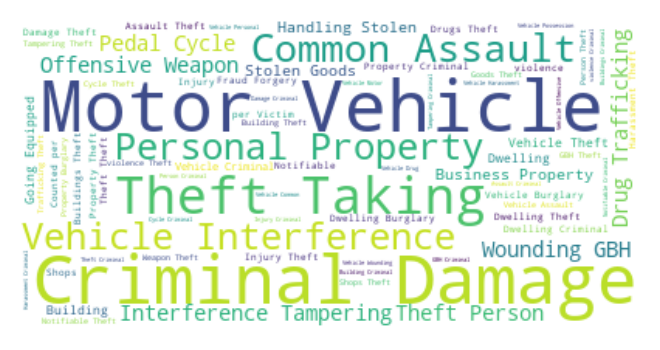

In [43]:
stopwords = set(STOPWORDS)
plt.figure(figsize=(4,4),dpi=200)
crimes_wordcloud = WordCloud(background_color="white",
                             stopwords=stopwords).generate(" ".join(df["minor_category"]))
plt.imshow(crimes_wordcloud,interpolation="bilinear")
plt.axis("off")
plt.show()

Berdasarkan word cloud di atas terlihat bahwa pada kejahatan kategori ringan, kata yang sering muncul adalah Motor Vehicle dan Criminal Damage. 

## Folium and Choropleth maps - Bagaimana kejahatan di London secara umum?

Urutkan dataset berdasarkan wilayah dan variabelnya diberi nama borough_order

In [23]:
borough_order = df.sort_values("borough")
borough_order.head()

,borough,major_category,minor_category,value
date,,,,
2008-01-01,Barking and Dagenham,Burglary,Burglary in Other Buildings,3
2009-08-01,Barking and Dagenham,Criminal Damage,Criminal Damage To Dwelling,1
2012-02-01,Barking and Dagenham,Theft and Handling,Motor Vehicle Interference & Tampering,0
2013-11-01,Barking and Dagenham,Theft and Handling,Theft From Shops,0
2013-11-01,Barking and Dagenham,Criminal Damage,Criminal Damage To Dwelling,2


Mencari garis lintang dan bujur untuk setiap wilayah

In [24]:
from geopy.geocoders import Nominatim

geolocator = Nominatim(user_agent="MyApp")

latitude,longitude = ([] for i in range(2))
for i in borough_order["borough"].unique():
    location = geolocator.geocode(i,timeout=None)
    latitude.append(location.latitude)
    longitude.append(location.longitude)

Pisahkan dataset borough_order berdasarkan wilayah 

In [25]:
temp_borough = []
for i in borough_order["borough"].unique():
    temp_borough.append(borough_order[borough_order["borough"] == i])

Masukkan garis lintang dan garis bujur ke setiap dataset yang dipisahkan

In [ ]:
for i,j,k in zip(temp_borough,latitude,longitude):
    i.insert(4,"latitude",j)
    i.insert(5,"longitude",k)

Gabungkan semua dataset yang dipisahkan dan resor berdasarkan indeks tanggal

In [28]:
borough_coordinate = pd.concat(temp_borough)
borough_coordinate = borough_coordinate.sort_index()
borough_coordinate.head()

,borough,major_category,minor_category,value,latitude,longitude
date,,,,,,
2008-01-01,Barking and Dagenham,Burglary,Burglary in Other Buildings,3,51.554091,0.150489
2008-01-01,Richmond upon Thames,Theft and Handling,Handling Stolen Goods,0,51.440553,-0.307639
2008-01-01,Brent,Drugs,Possession Of Drugs,0,32.937346,-87.164718
2008-01-01,Richmond upon Thames,Robbery,Personal Property,0,51.440553,-0.307639
2008-01-01,Brent,Violence Against the Person,Harassment,0,32.937346,-87.164718


Untuk mengurangi computational cost, 5000 sampel akan diambil dari dataset

In [29]:
borough_coordinate_sample = borough_coordinate.sample(n=5000,random_state=42,axis=0)
borough_coordinate_sample.head()

,borough,major_category,minor_category,value,latitude,longitude
date,,,,,,
2016-01-01,Tower Hamlets,Burglary,Burglary in a Dwelling,0,51.128863,1.298669
2008-09-01,Croydon,Criminal Damage,Other Criminal Damage,1,51.371305,-0.101957
2008-05-01,Camden,Theft and Handling,Theft From Motor Vehicle,1,39.944840,-75.119891
2010-02-01,Newham,Violence Against the Person,Harassment,0,51.530016,0.029309
2013-12-01,Greenwich,Other Notifiable Offences,Going Equipped,0,51.468626,0.048831


Mencari garis lintang dan garis bujur London

In [30]:
london = geolocator.geocode("London")

In [31]:
print(f"London's latitude\t:{london.latitude}")
print(f"London's longitude\t:{london.longitude}")

London's latitude	:51.4893335
London's longitude	:-0.14405508452768728


In [32]:
london = geolocator.geocode("London",timeout=None)
london.latitude,london.longitude

(51.4893335, -0.14405508452768728)

Membuat peta untuk menunjukkan jumlah ekjahatan dan kategorinya.

In [33]:
london_map = folium.Map(location=[london.latitude,london.longitude],zoom_start=10)

crimes = plugins.MarkerCluster().add_to(london_map)

for i,j,k in zip(borough_coordinate_sample["latitude"],
                 borough_coordinate_sample["longitude"],
                 borough_coordinate_sample["major_category"]):
    folium.Marker(location=[i,j],
                  icon=None,
                  popup=k).add_to(crimes)

london_map

Download GeoJSON file yang mendefinisikan daerah di London 

In [34]:
with urlopen("https://skgrange.github.io/www/data/london_boroughs.json") as response:
    london_boroughs = json.load(response)

Mengambil ID untuk tiap daerah dari GeoJSON file

In [35]:
boroughs_id = {}
for i in london_boroughs["features"]:
    i["id"] = i["properties"]["id"]
    boroughs_id[i["properties"]["name"]] = i["id"]

Menambahkan ID ke dataframe 

In [36]:
borough_crimes = df.groupby("borough")[["value"]].sum().reset_index()
borough_crimes["id"] = borough_crimes["borough"].apply(lambda x: boroughs_id[x])
borough_crimes.head()

,borough,value,id
0,Barking and Dagenham,149447,32
1,Barnet,212191,10
2,Bexley,114136,15
3,Brent,227551,9
4,Bromley,184349,3


Membuat Chloropleth Maps untuk memvisualisasikan jumlah kejahatan di London pada tahun 2008

In [37]:
fig = go.Figure()
fig = px.choropleth_mapbox(
    borough_crimes,
    geojson=london_boroughs,
    locations="id",
    mapbox_style="open-street-map",
    center={"lat":london.latitude,"lon":london.longitude},
    hover_name="borough",
    color="value",
    color_continuous_scale="pubu",
    labels={"id":"ID","value":"Number of Crimes"},
    zoom=8.7
)
fig.update_layout(margin={"r":0,"l":0,"b":0},title="Number of Crimes at London in 2008",title_x=0.5)
fig.show()